<div style="direction:rtl;line-height:300%;font-family:BNazanin,">
<font face="XB Zar" size=5.2>
<div align=center>
<font face="B Titr" size=5.1>
<p></p>
بسمه تعالی
<p></p>
</font>
<p></p>
<font>
تمرین عملی درس سیگنال‌ها و سیستم‌ها
<br>
استاد: دکتر منظوری شلمانی
</font>
<p></p>

</div>
</font>
</div>

<div style="direction:rtl;font-family:BNazanin,">
در هر بخش ابتدا کتابخانه‌های موردنیاز را ایمپورت میکنم. و توضیحات هر بخش را قبل از کد آن نوشته ام.
<br><br>
<font face="B Titr" size=4.>
سوال 1
<br>
</font>
از منابع زیر برای سوال 1 کمک گرفتم:
</div>

[Playing a sound in a ipython notebook](https://stackoverflow.com/questions/16241944/playing-a-sound-in-a-ipython-notebook)
<br>
[Audio Sample Rate](https://www.izotope.com/en/learn/digital-audio-basics-sample-rate-and-bit-depth.html)
<br>
[Sampling wav audio file](https://stackoverflow.com/questions/30619740/downsampling-wav-audio-file)
<br>
[scipy.fft and ifft](https://docs.scipy.org/doc/scipy/reference/generated/scipy.fft.ifft.html)
<br>
[scipy.fftshift() in Python](https://www.geeksforgeeks.org/scipy-fftshift-in-python/)
<br>
[matplotlib.pyplot.plot](https://matplotlib.org/2.1.2/api/_as_gen/matplotlib.pyplot.plot.html)
<br>

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 1. الف
<br>
</font>
 ابتدا فایل‌های music1.wav و music2.wav را به کمک کتابخانه IPython  پخش میکنیم. 
</div>

In [4]:
import IPython

IPython.display.Audio("music1.wav")

In [5]:
IPython.display.Audio("music2.wav")

<div style="direction:rtl;font-family:BNazanin,">
سپس اطلاعات زمانی هردو فایل را با کمک wavfile.read خوانده و نرخ نمونه‌برداری جدید هر دو را برابر 44100(نمونه بر ثانیه) که استاندارد فایل صوتی میباشد قرار داده و   نمونه برداری میکنیم. سپس fft آن‌ها که همان تبدیل فوریه و معادل فرکانسی سیگنال میباشد را در freq1 و freq2 قرار میدهیم.  برابر بودن نرخ نمونه برداری هردو فایل، در قسمت‌های بعد و جهت ترکیب خطی آنها در جمع نیاز است.  
<br>
سپس freq1 که اطلاعات فرکانسی فایل اول میباشد را شیفت فرکانسی داده و در shifted_freq1 قرار میدهیم. و مجددا به حوزه‌ی زمان برمیگردانیم(معکوس تبدیل فوریه) و در shifted_data1 قرار میدهیم. این اطلاعات زمانی را در Q1.a_shifted_music1.wav نوشته و آن را پخش میکنیم.   
</div>

In [8]:
import scipy.io.wavfile as wavfile
from scipy.signal import resample
from scipy.fft import fft , fftfreq , ifft, fftshift
import numpy as np

sample_rate1, data1 = wavfile.read("music1.wav")
sample_rate2, data2 = wavfile.read("music2.wav")
print(sample_rate1, sample_rate2)

sample_rate = 44100 #Number of samples taken per second - 44.1 kHz is standard audio sample rate.
number_of_samples1 = round(len(data1) * np.float64(sample_rate) / sample_rate1)
number_of_samples2 = round(len(data2) * np.float64(sample_rate) / sample_rate2)
freq1 = fft(resample(np.float64(data1), number_of_samples1))
freq2 = fft(resample(np.float64(data2), number_of_samples2))

shifted_freq1 = fftshift(freq1)
shifted_data1 = (ifft(shifted_freq1))
wavfile.write("Q1.a_shifted_music1.wav", sample_rate, shifted_data1.astype(np.int16))
IPython.display.Audio("Q1.a_shifted_music1.wav")

22050 22050


<ipython-input-8-39b3edf0dd82>:18: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("Q1.a_shifted_music1.wav", sample_rate, shifted_data1.astype(np.int16))


<div style="direction:rtl;font-family:BNazanin,">
علت صدای ناواضح: گوش انسان محدوده صداهایی که در فرکانس 20 تا 20000هرتز میباشند را میشنود. در سیگنال صوتی مذکور، با شیفت فرکانسی، صدای به دست آمده از این محدوده شنوایی خارج شده است(طبق نمودار) پس نمیتوان آن را شنید. همچنین طبق اطلاعات  سیگنال ها، مشاهده میشود که در سیگنال شیفت خورده، اعداد مختلطی نیز اضافه شده اند. این موارد مجموعا باعث میشود که توسط گوش انسان تشخیص داده نشود.
</div>

C:\Users\ASuS\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


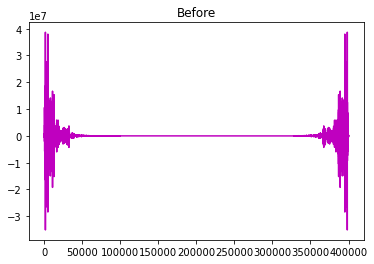

C:\Users\ASuS\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


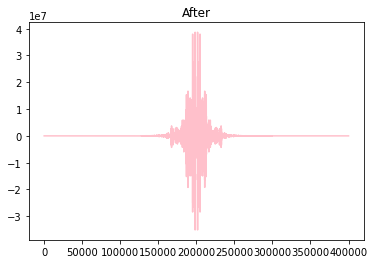

In [9]:
import matplotlib.pyplot as plt

plt.plot(freq1, color='m')
plt.title('Before')
plt.show()

plt.plot(shifted_freq1, color='pink')
plt.title('After')
plt.show()

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 1. ب
<br>
</font>
shifted_freq1 را با freq2 جمع میکنیم و در new_freq قرار میدهیم. سپس توسط تبدیل معکوس فوریه، به اطلاعات زمانی آن یعنی new_data رسیده و آن را در Q1.b_new_music.wav مینویسیم و پخش میکنیم.  
<br>
صدای دوم یعنی music2.wav شنیده شد.
<br>
چون شیفت فایل اول که صدای ناواضحی داشت را با معادل فرکانسی فایل دوم جمع کردیم. پس نهایتا همان صدای فایل دوم شنیده میشود.
</div>

In [14]:
new_freq = shifted_freq1 + freq2
new_data = (ifft(new_freq))
wavfile.write("Q1.b_new_music.wav", sample_rate, new_data.astype(np.int16))
IPython.display.Audio("Q1.b_new_music.wav")

<ipython-input-14-23e14cfd4200>:3: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("Q1.b_new_music.wav", sample_rate, new_data.astype(np.int16))


<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 1. ج
<br>
</font>
ابتدا اطلاعات فرکانسی بخش ب را شیفت فرکانسی داده و سپس به حوزه زمان میبرم(معکوس تبدیل فوریه). و آن را درQ1.c_new_music.wav نوشته و پخش میکنیم. 
<br>
صدای music1 پخش شد.
<br>
درواقع در این سیگنال، فایل اول دو بار شیفت خورده معادل حالت اولیه‌اش شده است ولی فایل دوم یک بار شیفت خورده است و ناواضح شده است. پس با جمع این ها فقط صدای فایل music1 را میشنویم.
</div>

In [15]:
new_freq = fftshift(new_freq)
new_data = ifft(new_freq)
wavfile.write("Q1.c_new_music.wav", sample_rate, new_data.astype(np.int16))
IPython.display.Audio("Q1.c_new_music.wav")

<ipython-input-15-90538b3a78c5>:3: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("Q1.c_new_music.wav", sample_rate, new_data.astype(np.int16))


<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2
<br>
</font>
از منابع زیر برای سوال 2 کمک گرفتم:
</div>

[Inverse Discrete Fourier Transformation (IDFT)](https://math.stackexchange.com/questions/3454134/simple-proof-of-inverse-discrete-fourier-transformation-idft)
<br>
[numpy.asarray](https://numpy.org/doc/stable/reference/generated/numpy.asarray.html)
<br>
[Understanding the fft](https://jakevdp.github.io/blog/2013/08/28/understanding-the-fft/)
<br>
[Creating multiple subplots using](https://matplotlib.org/devdocs/gallery/subplots_axes_and_figures/subplots_demo.html)

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 1
<br>
</font>   
<img src="Q2.1.png" width="800" height="400">
</div>

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 2
<br>
</font>
برای بردار  ورودی x، طول آن یعنی N را حساب کرده و بردار کامپوننت های نمایی فرمول یعنی exponents را میسازیم. سپس برای هر x[i]، آن را در کامپوننت مربوطه ضرب داخلی کرده و ftt را میسازیم. برای چک کردن درستی نیز تستی اضافه کردم. 
</div>

In [16]:
def fft(x):
    x = np.asarray(x, dtype=np.float64)
    N = x.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    exponents = np.exp(-2j * k * np.pi * n / N)
    return np.asarray([np.dot(exponents[i] , x) for i in range(N)])

#test
x = np.random.random(1000)
np.allclose(fft(x) , np.fft.fft(x))

True

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 3
<br>
</font>
برای بردار  ورودی X، طول آن یعنی N را حساب کرده و بردار کامپوننت های نمایی فرمول یعنی exponents را میسازیم. و برای هر X[i]، آن را در کامپوننت مربوطه ضرب داخلی کرده و  به N تقسیم کرده و ifft(X) را میسازیم.  برای چک کردن درستی نیز تستی اضافه کردم. 
</div>

In [18]:
def ifft(X):
    X = np.asarray(X)
    N = X.shape[0]
    n = np.arange(N)
    k = n.reshape((N, 1))
    exponents = np.exp(2j * k * np.pi* n / N)
    return np.asarray([np.dot(exponents[i] , X) for i in range(N)]) / N

#test
X = np.random.random(1000)
np.allclose(ifft(X), np.fft.ifft(X))

True

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 4
<br><br>
</font>
ابتدا x(t) را به کمک تابع کسینوس پیاده‌سازی کرده و سپس x[n] را به کمک x(n*T) پیاده سازی کردم. سپس T=0.5 و بردار 1000 تایی n که در رنج -500 تا 500 میباشد را به تابع پاس داده و مقادیر خروجی را در x نگهداری کرده و نمودار را رسم میکنیم.
</div>

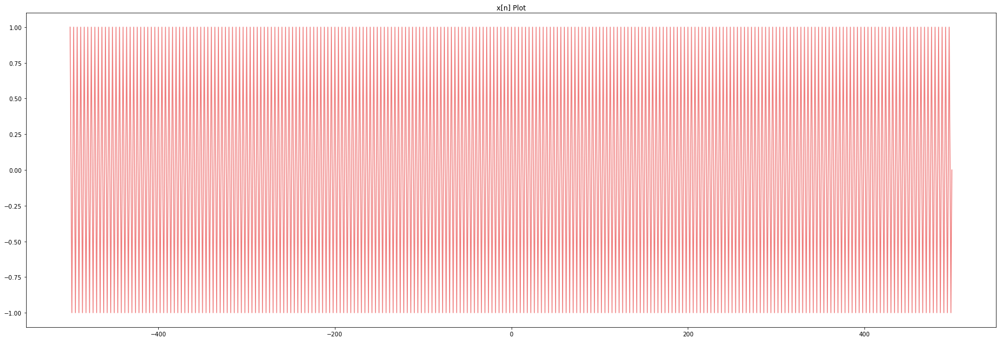

In [19]:
def x_t(t):
    return np.cos(np.pi * t)

def x_n(n , T):
    return x_t(n * T)

n = np.arange(-500, 500, 1) # N=1000
x = x_n(n, 0.5)
plt.figure(figsize = (30,10))
plt.plot(n, x, color='lightcoral')
plt.title('x[n] Plot')
plt.show()

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 5
<br><br>
</font>
$$x(t) = cos(\pi t) = \frac{e^{i\pi t} + e^{-i\pi t}}{2} $$
<br>
درنتیجه داریم:
<br>
 $$X(j\omega) = \pi( \delta (\omega - \pi) + \delta(\omega + \pi) )$$ 
</div>

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 6
<br><br>
</font>
fft گرفته و نمودار را رسم میکنیم. همانطور که طبق بخش قبل انتظار داشتیم، دو پیک در نمودار داریم.
</div>

C:\Users\ASuS\anaconda3\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


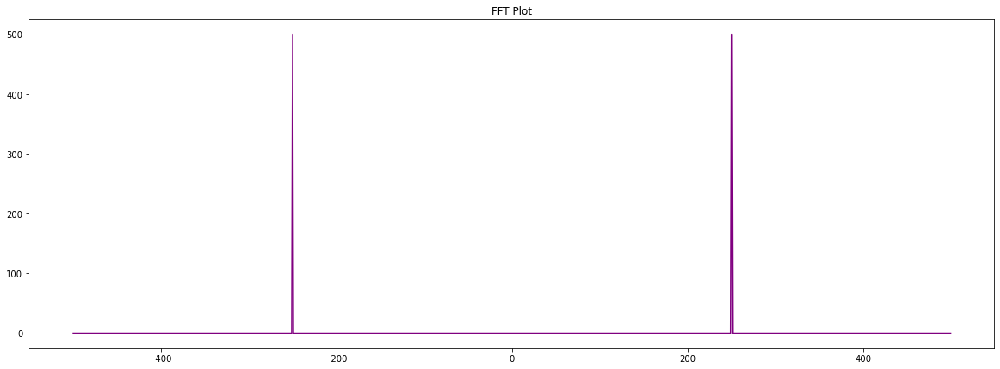

In [21]:
X_k = fft(x)
plt.figure(figsize = (20,7))
plt.plot(n, X_k, color='purple')
plt.title('FFT Plot')
plt.show()

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 7
<br><br>
</font>
ifft میگیریم. چون ifft(fft(a)) = a، پس انتظار داریم با بردار اولیه برابر باشد و طبق تست زیر همینطور است. 
</div>

In [22]:
ifft_of_X_k = ifft(X_k)
np.allclose(ifft_of_X_k, x)

True

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 2. بخش 8
<br><br>
</font>
هر سطر T برابر و هر ستون N برابری دارد. سطر اول کمترین T و درنتیجه فرکانس تغییرات بیشتری دارد. طبق نمودارها نتیجه میگیریم که شکل کلی سیگنال و فرکانس تغییرات و تناوب آن را T تعیین میکند. و تعداد نقاط و وضوح نمودار نیز توسط N کمتر یا زیادتر میشود.
</div>

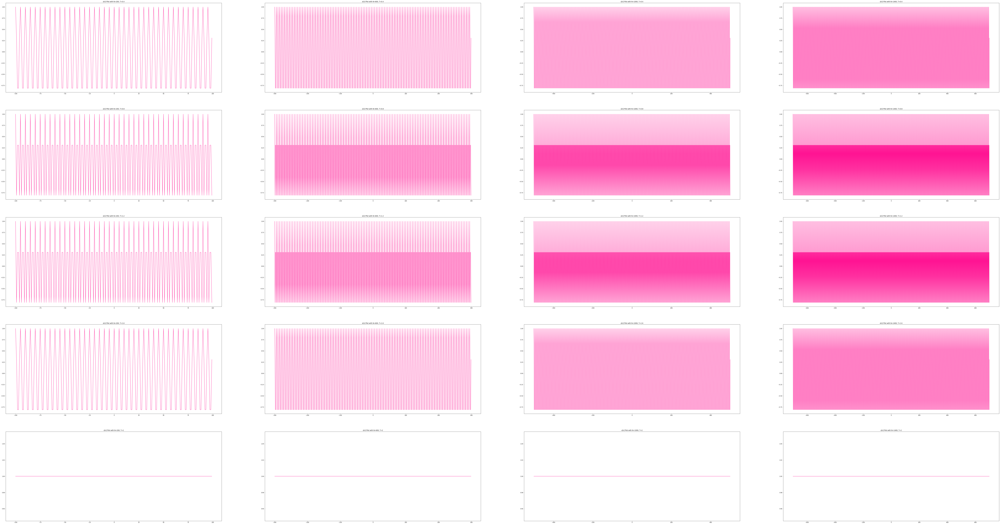

In [25]:
T = [0.4, 0.8, 1.2 , 1.6, 2]
N = [100, 300, 500, 700]
fig, axs = plt.subplots(nrows=len(T), ncols=len(N), figsize=(35 * len(N), 15 * len(T)))
for i in range(len(T)):
    for j in range(len(N)):
        n = np.arange(-N[j], N[j], 1) # N = 2*N[j]
        x = x_n(n, T[i])
        axs[i][j].set_title(f"x[n] Plot with N={2*N[j]}, T={T[i]}")
        axs[i][j].plot(n, x, color='deeppink')

plt.show()

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 3
<br>
</font>
از همان منابع سوال یک برای این سوال هم کمک گرفتم.
</div>

<div style="direction:rtl;font-family:BNazanin,">
برای ورودی x و خروجی y سیستم داریم :
<br>
$$y[n] = x[n] * h[n]$$
<br>
$$Y(j\omega) = X(j\omega).H(j\omega)$$
<br>
درنتیجه پاسخ فرکانسی سیستم را از رابطه‌ی زیر میتوان حساب کرد:
 <br>
$$H(j\omega) = \frac{Y_1 (j \omega)}{X_1 (j \omega)}$$
</div>

In [28]:
from scipy.fft import fft, ifft

sample_rate_clean1, data_clean1 = wavfile.read("clean1.wav")  #input1
sample_rate_distorted1, data_distorted1 = wavfile.read("distorted1.wav")  #output1
sample_rate_distorted2, data_distorted2 = wavfile.read("distorted2.wav") #output2

X1 = fft(data_clean1[:])
Y1 = fft(data_distorted1[:])
H = Y1 / X1
H = resample(H , round(len(data_distorted2)))

<div style="direction:rtl;font-family:BNazanin,">
سپس با داشتن H و همینطور fft خروجی دیگر یعنی distorted2.wav میتوان با کمک رابطه‌ی زیر، ورودی آن را حساب کرد:
<br><br>
$$Y_2(j\omega) = X_2(j\omega).H(j\omega)$$
<br>
$$X_2 = \frac{Y_2 (j\omega)}{H(j\omega)}$$
<br>
سپس از fft ورودی دوم یعنی X2، معکوس تبدیل فوریه گرفته و در recovered2 ذخیره کرده و در فایل .wav نوشته و آن را پخش میکنیم.
</div>

In [30]:
Y2 = fft(data_distorted2[:])
X2 = Y2 / H #fft of input2
recovered2 = ifft(X2) #input2
wavfile.write("recovered2.wav", sample_rate_distorted2, recovered2.astype(np.int16))
IPython.display.Audio("recovered2.wav")

<ipython-input-30-116e74b0c666>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  wavfile.write("recovered2.wav", sample_rate_distorted2, recovered2.astype(np.int16))


<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 4
<br><br>
</font>
از منابع و به ویژه ویدیوی زیر برای سوال 4 کمک گرفتم:
</div>

[Lowpass Digital Butterworth Filter](https://www.geeksforgeeks.org/noise-removal-using-lowpass-digital-butterworth-filter-in-scipy-python/)
<br>
[Signal filtering butterworth filter](https://oceanpython.org/2013/03/11/signal-filtering-butterworth-filter/)
<br>
[YouTube: Denoising Data with FFT](https://www.youtube.com/watch?v=s2K1JfNR7Sc)

<div style="direction:rtl;font-family:BNazanin,">
ابتدا اطلاعات زمانی noisy1.wav را خوانده و نمودار آن را رسم میکنیم.
</div>

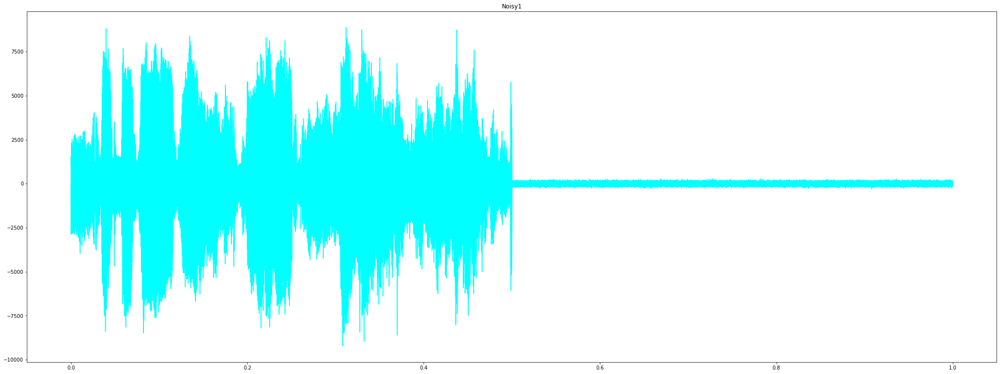

In [31]:
sample_rate_noisy1, data_noisy1= wavfile.read("noisy1.wav")
plt.figure(figsize = (35, 13))
t = np.arange(0, 1, 1/len(data_noisy1))
plt.plot(t, data_noisy1, color='cyan')
plt.title('Noisy1')
plt.show()

<div style="direction:rtl;font-family:BNazanin,">
سپس مثل روش معرفی شده در منابع ذکر شده در بالا، spectrum آن را حساب کرده و برای نصف فرکانس ها، نمودار آن را رسم میکنیم. طبق نمودار مشخص است که طیف فرکانسی از دو بخش داده اصلی و نویز تشکیل شده است که فرکانس‌های بالا مربوط به داده اصلی میباشد و نویز ها در فرکانس های پایین تر قرار دارند. 
</div>

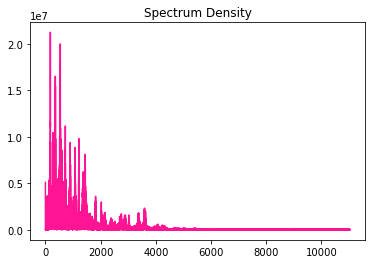

In [34]:
spectrum = np.abs(np.fft.rfft(data_noisy1))
firt_half_freqs = sample_rate_noisy1 * np.linspace(0,1, len(spectrum)) / 2
spectrum = spectrum[:np.size(firt_half_freqs)]
plt.plot(firt_half_freqs, spectrum, color='deeppink')
plt.title('Spectrum Density')
plt.show()

<div style="direction:rtl;font-family:BNazanin,">
 طبق اعداد نمودار به نظر spectrum های کمتر از 0.63e7 را میتوان به عنوان نویز درنظر گرفت و آن ها را حذف کرد. به کمک f1 و f2 اولین و آخرین جایی که spectrumبیشتر از 0.63e7 است را یافته و فیلتر را طراحی میکنیم.(اگر از 0 شروع کنیم نمیتوان f1 را پیدا کرد چون داده ی نویز است. با آزمون و خطا 10 را به دست آوردم) 
<br>
    سپس فیلتر Buterworth را با اعداد به دست آمده به عنوان cutoff frequency ساخته و روی داده دارای نویز اعمال میکنیم. و در فایل denoise1.wav نوشته و آن را پخش میکنیم. به نظر خوب کار می‌کند. و اگر بخش بزرگتری را حذف کنم، خود موسیقی اصلی بد شنیده میشود. 
</div>

In [38]:
from scipy import signal
#Design the Buterworth filter
f1 , f2 = None , None
for i in range(10, len(spectrum)):
    if (spectrum[i] > 0.63e7):
        if f1 == None:
            f1 = firt_half_freqs[i]
        f2 = firt_half_freqs[i]

N = 4   # Filter order
Wn = np.array([f1, f2])* 2 /sample_rate_noisy1   #Cutoff frequency
denoise1 = signal.sosfilt(signal.butter(N, Wn, btype='bandpass',output="sos"), data_noisy1)
wavfile.write("denoise1.wav" , sample_rate_noisy1, denoise1.astype(np.int16))
IPython.display.Audio("denoise1.wav")

<div style="direction:rtl;font-family:BNazanin,">
<font face="B Titr" size=4.>
سوال 5 
<br>
</font>
از منابع  زیر برای سوال 5 کمک گرفتم:
</div>

[Python Control Systems Library](https://pypi.org/project/control/)
<br>
[YouTube: Bode Plot Example in Control System, Procedure to Draw Bode Plot, Parameters of Bode Plot](https://www.youtube.com/watch?v=VyLnzXl90fs)
<br>
[Creating Bode Plots](https://jckantor.github.io/CBE30338/05.03-Creating-Bode-Plots.html)
<br>
[Bode_plot](https://en.wikipedia.org/wiki/Bode_plot)

In [345]:
pip install control


  Created wheel for control: filename=control-0.9.1-py2.py3-none-any.whl size=364704 sha256=f7cb94917e759681aa693ce827ad30511cac140b40c2d7d88a5f32fd084ec8a2
  Stored in directory: c:\users\asus\appdata\local\pip\cache\wheels\6e\8e\71\ee16865ba735139c6b4b9581a60028b7bf63468071ee308cb1
Successfully built control


<div style="direction:rtl;font-family:BNazanin,">
ابتدا کتابخانه control را ایمپورت کرده و سپس با دادن ضرایب صورت و مخرج به تابعTransferFunction میتوان H را تعریف کرد. سپس H را به عنوان ورودی به تابع bode این کتابخانه داده و نمودارهارا رسم میکند.  همچنین با control.pole و control.zero و دادن H به آنها، به ترتیب قطب ها و صفرهای سیتم را چاپ میکنیم. 
</div>

Poles:	 [ 2.63154432e-06+1378.41394363j  2.63154432e-06-1378.41394363j
 -5.26308864e-06   +0.j        ]

Zeroes:	 [-1.+3.j -1.-3.j]


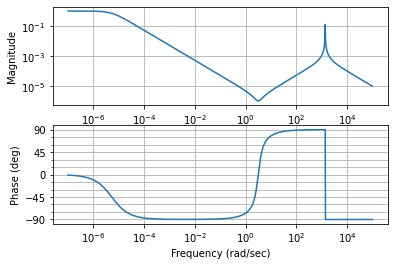

In [359]:
import control

H = control.TransferFunction([1,2,10], [1, 0, (25 + 1.9*10**6), 10])
mag, phase, omega = control.bode(H)
print("Poles:\t", control.pole(H))
print("\nZeroes:\t", control.zero(H))

<div style="direction:rtl;font-family:BNazanin,">
ابتدا تابعی برای H(jw) تعریف کرده و سپس برای w ورودی، در فضای لاگ اسپیس از -7 تا 4 یعنی معادل ده به توان -7 تا ده به توان 5  را تولید و مقادیر magnitude و phase را محاسبه میکنیم و سپس نمودار هردو را رسم میکنیم.  
<br>
طبق مقایسه ی نمودارها با قسمت قبل، با دقت خوبی رسم شده است و مشابه اند.
<br>
    به طور کلی در نمودار اندازه bode،  اگر نقطه‌ی شکست داشته باشیم و شیب نمودار کمتر شود یعنی  قطب داریم و اگر در نقطه‌ی شکست، شیب بیشترتر بشود نشان دهنده ی یک صفر است. همچنین هرقطب در نمودار فاز باعث کاهش  و هر صفر نیز باعث افزایش زاویه میشود. 
</div>

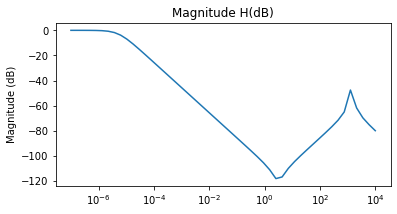

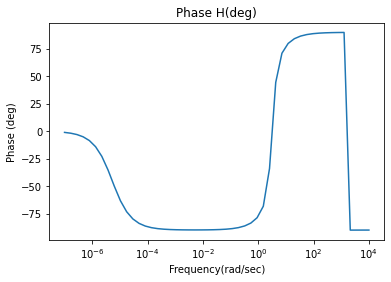

In [3]:
def H_jw(w):
    return ((1j*w)**2 + 2j*w + 10) / ((1j*w)**3 + 25 * 1j* w + 1.9 * 10**6 * 1j*w + 10)

w = np.logspace(-7 , 4)
magnitude_db = 20 * np.log10(np.abs(H_jw(w)))
phase = np.angle(H_jw(w)) * 180 / np.pi
plt.figure(figsize = (6, 3))
plt.title("Magnitude H(dB)")
plt.xscale("log")
plt.ylabel("Magnitude (dB)")
plt.plot(w, magnitude_db)
plt.show()

plt.title("Phase H(deg)")
plt.xscale("log")
plt.xlabel("Frequency(rad/sec)")
plt.ylabel("Phase (deg)")
plt.plot(w , phase)
plt.show()